## Extract latitude and longitude of areas from geojson file
The Geojson file contain geo data of Finland, which I downloaded from [NYU Spatial Data Repository](https://geo.nyu.edu/catalog/stanford-hv524rk9855) is fourth-level of administration of Finland. So It contains geo data of regions, subregions and municipalities of Finland.

pgeocode library provides users the way to get latitude and longitude of an area based on its postal code or zip code. However, in this notebook I will not use pgeocode library. I will use geopandas library to extract latitude/longitude from geojson file 

First of all, import pandas and geopandas to handle data

In [1]:
import pandas as pd 
import geopandas as gpd

Reading data from geojson file and put data in to geopandas dataframe

In [2]:
data_geo = gpd.read_file('Data/finland_adm4.geojson')
data_geo.head()

,id,id_0,iso,name_0,id_1,name_1,id_2,name_2,id_3,name_3,id_4,name_4,varname_4,ccn_4,cca_4,type_4,engtype_4,geometry
0,hv524rk9855.1,78,FIN,Finland,1,Eastern Finland,1,North Karelia,1,Ilomantsi,1,Ilomantsi,Ilomants,0,None,Kunta|Kommun,Municipality,"MULTIPOLYGON (((31.57370 62.91935, 31.57449 62..."
1,hv524rk9855.4,78,FIN,Finland,1,Eastern Finland,1,North Karelia,2,Joensuu,4,Joensuu,None,0,None,Kunta|Kommun,Municipality,"MULTIPOLYGON (((29.63643 62.65391, 29.64612 62..."
2,hv524rk9855.2,78,FIN,Finland,1,Eastern Finland,1,North Karelia,1,Ilomantsi,2,Tuupovaara,None,0,None,Kunta|Kommun,Municipality,"MULTIPOLYGON (((30.68583 62.32394, 30.68741 62..."
3,hv524rk9855.3,78,FIN,Finland,1,Eastern Finland,1,North Karelia,2,Joensuu,3,Eno,None,0,None,Kunta|Kommun,Municipality,"MULTIPOLYGON (((30.60005 62.66244, 30.59846 62..."
4,hv524rk9855.5,78,FIN,Finland,1,Eastern Finland,1,North Karelia,2,Joensuu,5,Kiihtelysvaara,None,0,None,Kunta|Kommun,Municipality,"MULTIPOLYGON (((30.18166 62.39774, 30.18317 62..."


I work with municiplity level so I extract the name and geometry of the fourth level.

In [3]:
df_latlon = data_geo[['name_4','geometry']]
df_latlon.head()

,name_4,geometry
0,Ilomantsi,"MULTIPOLYGON (((31.57370 62.91935, 31.57449 62..."
1,Joensuu,"MULTIPOLYGON (((29.63643 62.65391, 29.64612 62..."
2,Tuupovaara,"MULTIPOLYGON (((30.68583 62.32394, 30.68741 62..."
3,Eno,"MULTIPOLYGON (((30.60005 62.66244, 30.59846 62..."
4,Kiihtelysvaara,"MULTIPOLYGON (((30.18166 62.39774, 30.18317 62..."


In [4]:
#Applying the strip function to get rid of any ending whitespace characters that may have appeared
df_latlon['name_4'] = df_latlon['name_4'].str.strip()

c:\00.Study\GeoPython\venv-geo-3.9\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


Checking Coordinate Reference Systems (crs). The Coordinate Reference System (CRS) is important because the geometric shapes in a GeoSeries or GeoDataFrame object are simply a collection of coordinates in an arbitrary space. A CRS tells Python how those coordinates relate to places on the Earth.
Learn more about CRS in here: https://geopandas.org/docs/user_guide/projections.html

In [5]:
df_latlon.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [6]:
df_latlon.to_crs('EPSG:4326')

,name_4,geometry
0,Ilomantsi,"MULTIPOLYGON (((31.57370 62.91935, 31.57449 62..."
1,Joensuu,"MULTIPOLYGON (((29.63643 62.65391, 29.64612 62..."
2,Tuupovaara,"MULTIPOLYGON (((30.68583 62.32394, 30.68741 62..."
3,Eno,"MULTIPOLYGON (((30.60005 62.66244, 30.59846 62..."
4,Kiihtelysvaara,"MULTIPOLYGON (((30.18166 62.39774, 30.18317 62..."
...,...,...
432,Renko,"MULTIPOLYGON (((24.41684 60.75878, 24.41622 60..."
433,Tuulos,"MULTIPOLYGON (((24.80396 61.24984, 24.80464 61..."
434,Hausjärvi,"MULTIPOLYGON (((24.83642 60.66785, 24.83709 60..."
435,Loppi,"MULTIPOLYGON (((24.61558 60.66660, 24.61494 60..."


In [7]:
df_latlon = df_latlon.set_index("name_4")

In [8]:
df_latlon.shape

(437, 1)

Getting polygon areas using GeoPandas

In [9]:
df_latlon['area']=df_latlon.area
df_latlon['area']

<ipython-input-9-4cbc6632a46a>:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_latlon['area']=df_latlon.area


name_4
Ilomantsi         0.558246
Joensuu           0.020993
Tuupovaara        0.113108
Eno               0.191842
Kiihtelysvaara    0.092269
                    ...   
Renko             0.048016
Tuulos            0.028402
Hausjärvi         0.059943
Loppi             0.107143
Riihimäki         0.020287
Name: area, Length: 437, dtype: float64

In [10]:
df_latlon['boundary']=df_latlon.boundary
df_latlon['boundary']

name_4
Ilomantsi         MULTILINESTRING ((31.57370 62.91935, 31.57449 ...
Joensuu           MULTILINESTRING ((29.63643 62.65391, 29.64612 ...
Tuupovaara        MULTILINESTRING ((30.68583 62.32394, 30.68741 ...
Eno               MULTILINESTRING ((30.60005 62.66244, 30.59846 ...
Kiihtelysvaara    MULTILINESTRING ((30.18166 62.39774, 30.18317 ...
                                        ...                        
Renko             MULTILINESTRING ((24.41684 60.75878, 24.41622 ...
Tuulos            MULTILINESTRING ((24.80396 61.24984, 24.80464 ...
Hausjärvi         MULTILINESTRING ((24.83642 60.66785, 24.83709 ...
Loppi             MULTILINESTRING ((24.61558 60.66660, 24.61494 ...
Riihimäki         MULTILINESTRING ((24.69268 60.75397, 24.70185 ...
Name: boundary, Length: 437, dtype: geometry

In [11]:
df_latlon['centroid']=df_latlon.centroid
df_latlon['centroid']

<ipython-input-11-9a4e1fc5a748>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_latlon['centroid']=df_latlon.centroid


name_4
Ilomantsi         POINT (30.99776 62.83786)
Joensuu           POINT (29.78481 62.59468)
Tuupovaara        POINT (30.72302 62.46386)
Eno               POINT (30.27599 62.82022)
Kiihtelysvaara    POINT (30.31965 62.47200)
                            ...            
Renko             POINT (24.29538 60.86147)
Tuulos            POINT (24.81121 61.12010)
Hausjärvi         POINT (24.95339 60.77090)
Loppi             POINT (24.34012 60.69084)
Riihimäki         POINT (24.74157 60.71130)
Name: centroid, Length: 437, dtype: geometry

In [12]:
first_point = df_latlon['centroid'].iloc[0]
df_latlon['distance'] = df_latlon['centroid'].distance(first_point)
df_latlon['distance']

<ipython-input-12-a829ebff80bf>:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_latlon['distance'] = df_latlon['centroid'].distance(first_point)


name_4
Ilomantsi         0.000000
Joensuu           1.237085
Tuupovaara        0.464061
Eno               0.721979
Kiihtelysvaara    0.770509
                    ...   
Renko             6.987707
Tuulos            6.420594
Hausjärvi         6.388014
Loppi             6.995270
Riihimäki         6.607731
Name: distance, Length: 437, dtype: float64

<AxesSubplot:>

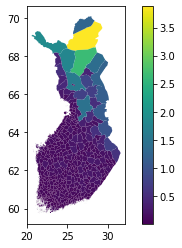

In [13]:
df_latlon.plot("area", legend=True)

<AxesSubplot:>

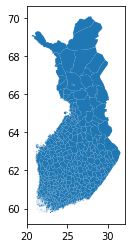

In [14]:
df_latlon = df_latlon.set_geometry("geometry")
boroughs_4326 = df_latlon.to_crs("EPSG:4326")
boroughs_4326.plot()

In [15]:
df_latlon.reset_index(inplace=True)

In [16]:
df_latlon.head()

,name_4,geometry,area,boundary,centroid,distance
0,Ilomantsi,"MULTIPOLYGON (((31.57370 62.91935, 31.57449 62...",0.558246,"MULTILINESTRING ((31.57370 62.91935, 31.57449 ...",POINT (30.99776 62.83786),0.000000
1,Joensuu,"MULTIPOLYGON (((29.63643 62.65391, 29.64612 62...",0.020993,"MULTILINESTRING ((29.63643 62.65391, 29.64612 ...",POINT (29.78481 62.59468),1.237085
2,Tuupovaara,"MULTIPOLYGON (((30.68583 62.32394, 30.68741 62...",0.113108,"MULTILINESTRING ((30.68583 62.32394, 30.68741 ...",POINT (30.72302 62.46386),0.464061
3,Eno,"MULTIPOLYGON (((30.60005 62.66244, 30.59846 62...",0.191842,"MULTILINESTRING ((30.60005 62.66244, 30.59846 ...",POINT (30.27599 62.82022),0.721979
4,Kiihtelysvaara,"MULTIPOLYGON (((30.18166 62.39774, 30.18317 62...",0.092269,"MULTILINESTRING ((30.18166 62.39774, 30.18317 ...",POINT (30.31965 62.47200),0.770509


Extract latitude and longitude from centroid point

In [17]:
coords = []
for i in range(0,len(df_latlon['centroid'])):
   item = {}
   item['name_4'] = df_latlon['name_4'][i]
   item['longitude'] = df_latlon['centroid'][i].x
   item['latitude'] = df_latlon['centroid'][i].y
   coords.append(item)
coords[0:5]

[{'name_4': 'Ilomantsi',
  'longitude': 30.99775706789931,
  'latitude': 62.83786175057543},
 {'name_4': 'Joensuu',
  'longitude': 29.78480979064734,
  'latitude': 62.59468009255339},
 {'name_4': 'Tuupovaara',
  'longitude': 30.723023120749875,
  'latitude': 62.46386478263028},
 {'name_4': 'Eno',
  'longitude': 30.275993217924718,
  'latitude': 62.82022293802606},
 {'name_4': 'Kiihtelysvaara',
  'longitude': 30.31965133380196,
  'latitude': 62.471996799064605}]

In [18]:
# convert coords into dataframe
df_coords = pd.DataFrame(coords) 

In [19]:
# merge 2 dataframes
df_geo_latlon = pd.merge(df_latlon,df_coords, on = 'name_4')

In [20]:
df_geo_latlon.head()

,name_4,geometry,area,boundary,centroid,distance,longitude,latitude
0,Ilomantsi,"MULTIPOLYGON (((31.57370 62.91935, 31.57449 62...",0.558246,"MULTILINESTRING ((31.57370 62.91935, 31.57449 ...",POINT (30.99776 62.83786),0.000000,30.997757,62.837862
1,Joensuu,"MULTIPOLYGON (((29.63643 62.65391, 29.64612 62...",0.020993,"MULTILINESTRING ((29.63643 62.65391, 29.64612 ...",POINT (29.78481 62.59468),1.237085,29.784810,62.594680
2,Tuupovaara,"MULTIPOLYGON (((30.68583 62.32394, 30.68741 62...",0.113108,"MULTILINESTRING ((30.68583 62.32394, 30.68741 ...",POINT (30.72302 62.46386),0.464061,30.723023,62.463865
3,Eno,"MULTIPOLYGON (((30.60005 62.66244, 30.59846 62...",0.191842,"MULTILINESTRING ((30.60005 62.66244, 30.59846 ...",POINT (30.27599 62.82022),0.721979,30.275993,62.820223
4,Kiihtelysvaara,"MULTIPOLYGON (((30.18166 62.39774, 30.18317 62...",0.092269,"MULTILINESTRING ((30.18166 62.39774, 30.18317 ...",POINT (30.31965 62.47200),0.770509,30.319651,62.471997


In [21]:
# final dataframe 
df_geo_latlon = df_geo_latlon[['name_4','latitude','longitude']]
df_geo_latlon.head()

,name_4,latitude,longitude
0,Ilomantsi,62.837862,30.997757
1,Joensuu,62.594680,29.784810
2,Tuupovaara,62.463865,30.723023
3,Eno,62.820223,30.275993
4,Kiihtelysvaara,62.471997,30.319651


In [22]:
#rename columns
df_geo_latlon=df_geo_latlon.rename(columns={'name_4':'municipality'})

In [23]:
df_geo_latlon.head()

,municipality,latitude,longitude
0,Ilomantsi,62.837862,30.997757
1,Joensuu,62.594680,29.784810
2,Tuupovaara,62.463865,30.723023
3,Eno,62.820223,30.275993
4,Kiihtelysvaara,62.471997,30.319651


In [24]:
df_geo_latlon.to_csv('Data/fin_geo_data.csv')